<a href="https://colab.research.google.com/github/DmitryKutsev/ml_hw/blob/master/overfitting_validation_my.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

based on How to not overfit? Kaggle solution https://www.kaggle.com/artgor/how-to-not-overfit

In [1]:
import os
import json
import ast
import time
import datetime
import numpy as np
import pandas as pd
pd.set_option('max_columns', None)
import matplotlib.pyplot as plt
import seaborn
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [0]:
from scipy import stats
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, GridSearchCV, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn import model_selection
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn import linear_model
from sklearn.neighbors import NearestNeighbors

In [3]:
!pip install eli5

     |████████████████████████████████| 112kB 2.7MB/s 


In [4]:
!pip install shap

     |████████████████████████████████| 276kB 2.6MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394158 sha256=33aac59c609ae27c4ae85df66270e9a4ed57f0b89dad4090aa6fa3fb441d69a1
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [5]:
import eli5
from eli5.sklearn import PermutationImportance
import shap

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.

Using TensorFlow backend.


In [0]:
import warnings
warnings.filterwarnings('ignore')

In [0]:
from sklearn.datasets import make_classification


### создание своего датасета (random seed, data exploration)

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.datasets import fetch_20newsgroups
count_vect = CountVectorizer()

In [0]:
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories, shuffle=True, random_state=42)

In [0]:
X, y = count_vect.fit(twenty_train.data).transform(twenty_train.data).toarray(), twenty_train.target

In [0]:
# X, y = make_classification(n_classes=2,
#     weights=[0.7, 0.3], 
#     n_informative=40, n_redundant=45, n_features=200, 
#     n_clusters_per_class=4, 
#     n_samples=1000, random_state=4) #np.random.randint(10000)

In [52]:
X[:5, :4]

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [1, 0, 0, 0]])

In [0]:
features = pd.DataFrame(X)

In [0]:
answers = pd.DataFrame(y)

In [55]:
features.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

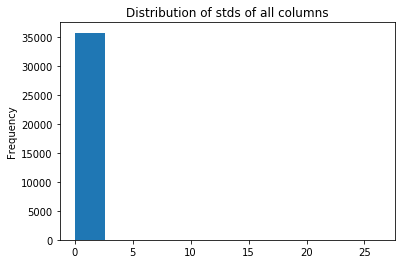

In [56]:
#данные не нормализованы
features.std().plot('hist');
plt.title('Distribution of stds of all columns');

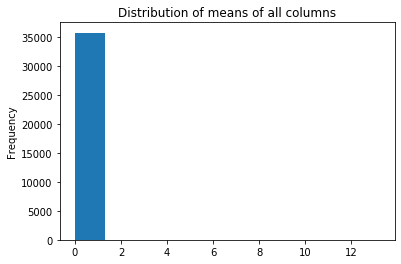

In [57]:
features.mean().plot('hist');
plt.title('Distribution of means of all columns');

In [58]:
# проверим, что нет пустых значений
features.isnull().any().any()

False

In [59]:
#дисбаланс классов
answers[0].value_counts()

3    599
2    594
1    584
0    480
Name: 0, dtype: int64

### обучение

In [0]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.70, random_state=42)

In [61]:
np.std(X_train, axis=0)

array([0.35148268, 0.33959923, 0.        , ..., 0.        , 0.03840473,
       0.03840473])

In [0]:
#Нормируем данные
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [63]:
np.mean(X_train, axis=0)

array([-2.38689751e-16,  1.69690292e-16,  0.00000000e+00, ...,
        0.00000000e+00, -2.09212263e-16,  8.86169523e-17])

## как оценить примерное качество модели, если тест закрыт?

In [0]:
# обучимся на том, что есть, и оценим качество предсказаний на трейне
model = linear_model.LogisticRegression()
model = model.fit(X_train, y_train)
train_preds = model.predict_proba(X_train)
test_preds = model.predict_proba(X_test)

In [75]:
print('result on train: {}'.format(roc_auc_score(y_train, train_preds, multi_class='ovo', average='macro')))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds, multi_class='ovo', average='macro')))

result on train: 1.0
result on test: 0.9914857741951367


### Overfitting!

![](https://i.stack.imgur.com/1QU0m.png)

## Cross Validation (+ stratification)

![](https://scikit-learn.org/stable/_images/grid_search_cross_validation.png)

### KFold, StratifiedKFold, RepeatedStratifiedKFold

In [0]:
n_fold = 10
folds = KFold(n_splits=n_fold, shuffle=True, random_state=0)
stratified_folds = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=0)
repeated_folds = RepeatedStratifiedKFold(n_splits=n_fold, n_repeats=20, random_state=0)

In [77]:
for train_index, valid_index in folds.split(X_train, y_train):
    print("TRAIN:", len(train_index), "TEST:", len(valid_index))
    print('number of positives {}'.format(int(sum(y_train[valid_index]))))

TRAIN: 609 TEST: 68
number of positives 99
TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 110
TRAIN: 609 TEST: 68
number of positives 104
TRAIN: 609 TEST: 68
number of positives 99
TRAIN: 609 TEST: 68
number of positives 115
TRAIN: 609 TEST: 68
number of positives 108
TRAIN: 610 TEST: 67
number of positives 113
TRAIN: 610 TEST: 67
number of positives 115
TRAIN: 610 TEST: 67
number of positives 86


In [78]:
for train_index, valid_index in stratified_folds.split(X_train, y_train):
    print("TRAIN:", len(train_index), "TEST:", len(valid_index))
    print('number of positives {}'.format(int(sum(y_train[valid_index]))))

TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 106
TRAIN: 609 TEST: 68
number of positives 105
TRAIN: 609 TEST: 68
number of positives 105
TRAIN: 610 TEST: 67
number of positives 103
TRAIN: 610 TEST: 67
number of positives 106
TRAIN: 610 TEST: 67
number of positives 106


In [0]:
from sklearn.preprocessing import LabelEncoder
class_labels = LabelEncoder()


In [0]:
def cv_train_model(X, y, X_test, y_test, folds=folds, plot_feature_importance=False, model=None):
    oof = np.zeros(len(X))
    prediction = np.zeros(len(X_test))
    valid_scores = []
    feature_importance = pd.DataFrame()
    for fold_n, (train_index, valid_index) in enumerate(folds.split(X, y)):
        X_train, X_valid = X[train_index], X[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
          

        model.fit(X_train, y_train)      
        y_pred_test = model.predict_proba(X_test)[:, 1]
        y_pred_valid = model.predict_proba(X_valid)
        valid_score = roc_auc_score(y_valid, y_pred_valid, multi_class='ovo', average='macro')
        #print(valid_index)
        oof[valid_index] = y_pred_valid.shape[0]
        valid_scores.append(valid_score)
        prediction += class_labels.fit_transform(y_pred_test) 
        
    prediction /= (fold_n + 1)
    # class_labels = LabelEncoder()
    prediction_le = class_labels.fit_transform(prediction)
    test_score = roc_auc_score(np.atleast_2d(y_test), prediction_le, multi_class='ovr', average='samples')
    print('Cross Validation mean score: {0:.4f}, std: {1:.4f}.'.format(np.mean(valid_scores), np.std(valid_scores)))
    print("Score on test data: {0:.4f}".format(test_score))
    

    return  prediction_le, valid_scores

In [184]:
model = linear_model.LogisticRegression()
prediction_lr, scores = cv_train_model(X_train, y_train, X_test, y_test,  model=model,  folds=folds)

ValueError: ignored

In [0]:
scores

In [0]:
# попробуем другие разбиения на трейн и валидацию
model = linear_model.LogisticRegression() # penalty='l1', C=0.1
oof_lr, prediction_lr_stratified, scores = cv_train_model(X_train, y_train, X_test, y_test, model=model,  folds=stratified_folds)

Cross Validation mean score: 0.6781, std: 0.1010.
Score on test data: 0.6870


In [0]:
model = model.fit(X_train, y_train)
train_preds = model.predict_proba(X_train)[:, 1]
test_preds = model.predict_proba(X_test)[:, 1]
print('result on train: {}'.format(roc_auc_score(y_train, train_preds)))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds)))

result on train: 1.0
result on test: 0.6726268943711531


In [0]:
model = linear_model.LogisticRegression(penalty = 'l1', solver = 'liblinear')
oof_lr, prediction_lr_repeated, scores = cv_train_model(X_train, y_train, X_test, y_test,  model=model, folds=repeated_folds)

Cross Validation mean score: 0.6660, std: 0.0941.
Score on test data: 0.6908



## ELI5

ELI5 позволяет смотреть на вклад разных признаков 

In [0]:
eli5.show_weights(model, top=50)

Weight?,Feature
+1.241,x121
+1.048,x84
+0.927,x125
+0.826,x69
+0.729,x159
+0.722,x86
+0.718,x106
+0.681,x30
+0.595,x189
+0.578,x88


Выберем признаки, вносящие, максимальный вклад, и оставим только их

In [0]:
sum(sum(model.coef_ != 0))


122

In [0]:
eli5.formatters.as_dataframe.explain_weights_df(model)

,target,feature,weight
0,1,x121,1.240749
1,1,x84,1.048368
2,1,x125,0.927326
3,1,x69,0.825571
4,1,x159,0.728960
...,...,...,...
118,1,x76,-0.918474
119,1,x15,-1.054850
120,1,x168,-1.121052
121,1,x78,-1.694175


In [0]:
top_features = [int(i[1:]) for i in eli5.formatters.as_dataframe.explain_weights_df(model).feature if 'BIAS' not in i]

In [0]:
top_features

[121,
 84,
 125,
 69,
 159,
 86,
 106,
 30,
 189,
 88,
 21,
 169,
 27,
 153,
 2,
 110,
 46,
 96,
 83,
 71,
 50,
 181,
 41,
 37,
 9,
 54,
 3,
 182,
 36,
 53,
 13,
 177,
 108,
 18,
 22,
 105,
 5,
 66,
 104,
 100,
 190,
 188,
 91,
 160,
 161,
 35,
 63,
 92,
 43,
 80,
 79,
 197,
 118,
 150,
 136,
 196,
 1,
 171,
 187,
 24,
 40,
 180,
 191,
 185,
 116,
 146,
 135,
 33,
 149,
 62,
 23,
 10,
 199,
 144,
 112,
 113,
 75,
 64,
 28,
 58,
 81,
 49,
 154,
 139,
 155,
 178,
 183,
 175,
 98,
 38,
 131,
 115,
 167,
 133,
 67,
 140,
 107,
 74,
 117,
 147,
 93,
 198,
 48,
 132,
 51,
 176,
 6,
 16,
 20,
 94,
 101,
 184,
 186,
 192,
 11,
 195,
 14,
 12,
 76,
 15,
 168,
 78]

In [0]:
X_train_eli5 = X_train[:,top_features]
X_test_eli5 = X_test[:,top_features]

In [0]:
eli5_model = linear_model.LogisticRegression() #penalty = 'l1'
oof_lr, prediction_lr, _ = cv_train_model(X_train_eli5, y_train, X_test_eli5, y_test, model=eli5_model, folds = folds)

Cross Validation mean score: 0.7812, std: 0.1095.
Score on test data: 0.6801


In [0]:
eli5_model = model.fit(X_train_eli5, y_train)
train_preds = eli5_model.predict_proba(X_train_eli5)[:, 1]
test_preds = eli5_model.predict_proba(X_test_eli5)[:, 1]
print('result on train: {}'.format(roc_auc_score(y_train, train_preds)))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds)))

result on train: 0.9978893411729233
result on test: 0.6841343628272095


### Permutation importance
другой способ посмотреть на важность признаков  - Permutation importance
* Обучаем модель
* Во время валидации смешиваем случайным образом данные в одной из колонок
* Чем сильнее падает метрика, тем важнее признак

см.: https://www.kaggle.com/dansbecker/permutation-importance

In [0]:
X_train.shape

(300, 200)

In [0]:
perm = PermutationImportance(model, random_state=1).fit(X_train, y_train)

In [0]:
eli5.show_weights(perm, top=50)

Weight,Feature
0.0560 ± 0.0136,x86
0.0533 ± 0.0211,x18
0.0527 ± 0.0181,x53
0.0453 ± 0.0331,x49
0.0440 ± 0.0195,x26
0.0367 ± 0.0094,x164
0.0353 ± 0.0068,x179
0.0353 ± 0.0200,x8
0.0233 ± 0.0152,x195
0.0213 ± 0.0100,x19


In [0]:
weights = eli5.formatters.as_dataframe.explain_weights_df(perm)

In [0]:
top_features = [int(i[1:]) for i in weights[weights.weight != 0].feature if 'BIAS' not in i]

In [0]:
X_train_perm = X_train[:,top_features]
X_test_perm = X_test[:,top_features]

In [0]:
X_test_perm.shape

(700, 106)

In [0]:
perm_model = linear_model.LogisticRegression()
oof_lr1, prediction_lr1, _ = cv_train_model(X_train_perm, y_train, X_test_perm, y_test, model=perm_model)

Cross Validation mean score: 0.7972, std: 0.1079.
Score on test data: 0.6859


In [0]:
perm_model = perm_model.fit(X_train_perm, y_train)
train_preds = perm_model.predict_proba(X_train_perm)[:, 1]
test_preds = perm_model.predict_proba(X_test_perm)[:, 1]
print('result on train: {}'.format(roc_auc_score(y_train, train_preds)))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds)))

result on train: 0.9966329966329966
result on test: 0.6830044305240309


## SHAP

Еще можно использовать SHAP для визуализации важности признаков

In [0]:
model = linear_model.LogisticRegression()
oof_lr1, prediction_lr1, _ = cv_train_model(X_train, y_train, X_test, y_test,  model=model, folds = folds)

Cross Validation mean score: 0.6736, std: 0.1356.
Score on test data: 0.6896


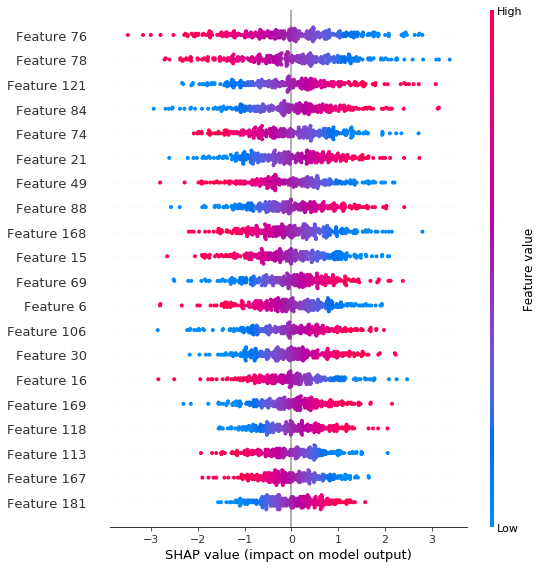

In [0]:
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_train)

shap.summary_plot(shap_values, X_train)

В некоторых моделях, например в деревьях решений, есть встроенный метод feature_importances_

In [0]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
train_preds = dtc.predict_proba(X_train)[:, 1]
test_preds = dtc.predict_proba(X_test)[:, 1]
print('result on train: {}'.format(roc_auc_score(y_train, train_preds)))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds)))


result on train: 1.0
result on test: 0.5016011864839078


In [0]:
feature_importance = pd.DataFrame()
feature_importance["feature"] = features.columns
feature_importance["importance"] = dtc.feature_importances_
feature_importance[["feature", "importance"]].sort_values(by = 'importance', ascending = False)[:20]

,feature,importance
196,196,0.090909
121,121,0.087154
128,128,0.064566
114,114,0.062856
8,8,0.061385
74,74,0.057648
19,19,0.047852
25,25,0.043388
106,106,0.041539
50,50,0.040460


## Grid Search

![](https://www.kdnuggets.com/wp-content/uploads/hyper-parameter-search.jpg)

In [0]:
%%time

#np.arange(0,2,.5)
#np.linspace(0,2,10)

lr = linear_model.LogisticRegression()

parameter_grid = {'class_weight' : ['balanced', None],
                  'penalty' : ['l2', 'l1'],
                  'solver' : ['liblinear', 'saga'],
                  'C' : [0.001, 0.01, 0.08, 0.1, 0.15, 1.0, 10.0, 100.0],
                  'max_iter': [2,10,50,100,1000]
                 }

grid_search = GridSearchCV(lr, param_grid=parameter_grid, cv=folds, scoring='roc_auc')
grid_search.fit(X_train, y_train)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.7734058534058535
Best parameters: {'C': 0.1, 'class_weight': 'balanced', 'max_iter': 10, 'penalty': 'l1', 'solver': 'liblinear'}
CPU times: user 4min 56s, sys: 192 ms, total: 4min 56s
Wall time: 4min 56s


In [0]:
model = linear_model.LogisticRegression(C = 0.1, class_weight= 'balanced', max_iter = 10, penalty = 'l1', solver = 'liblinear')
oof_lr, prediction_lr, scores = cv_train_model(X_train, y_train, X_test, y_test,  model=model, folds = stratified_folds)

Cross Validation mean score: 0.7038, std: 0.1179.
Score on test data: 0.7342


In [0]:
model = model.fit(X_train, y_train)
train_preds = model.predict_proba(X_train)[:, 1]
test_preds = model.predict_proba(X_test)[:, 1]
print('result on train: {}'.format(roc_auc_score(y_train, train_preds)))
print('result on test: {}'.format(roc_auc_score(y_test,test_preds)))

result on train: 0.8845168098899442
result on test: 0.7278449019238584


### примеры с другими моделями

In [0]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

parameter_grid = {'splitter' : ['best', 'random'],
                  'max_depth' : [2, 3, 4, 5, 10, 20, 30]}

grid_search = GridSearchCV(dtc, param_grid=parameter_grid, cv=folds, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train, y_train)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))
dtc = DecisionTreeClassifier(**grid_search.best_params_)
oof_knc, prediction_knc, scores_knc = cv_train_model(X_train, y_train, X_test, y_test,  model=knc, folds = stratified_folds)

In [0]:
from sklearn.neighbors import KNeighborsClassifier
knc = KNeighborsClassifier()

parameter_grid = {'n_neighbors': [2, 3, 5, 10, 20, 30],
                  'weights': ['uniform', 'distance']}

grid_search = GridSearchCV(knc, param_grid=parameter_grid, cv=folds, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train, y_train)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))
knc = KNeighborsClassifier(**grid_search.best_params_)
oof_knc, prediction_knc, scores_knc = cv_train_model(X_train, y_train, X_test, y_test,  model=knc, folds = stratified_folds)

Best score: 0.7533234080734081
Best parameters: {'n_neighbors': 10, 'weights': 'uniform'}
Cross Validation mean score: 0.7375, std: 0.1375.
Score on test data: 0.6733


In [0]:
from sklearn.naive_bayes import BernoulliNB
bnb = BernoulliNB()

parameter_grid = {'alpha': [1e-06, 1e-04, 0.001, 0.1, 2, 10] }

grid_search = GridSearchCV(bnb, param_grid=parameter_grid, cv=folds, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train, y_train)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))
bnb = BernoulliNB(**grid_search.best_params_)
oof_bnb, prediction_bnb, scores_bnb = cv_train_model(X_train, y_train, X_test, y_test,  model=bnb, folds = stratified_folds)

Best score: 0.7126741776741776
Best parameters: {'alpha': 1e-06}
Cross Validation mean score: 0.6841, std: 0.1159.
Score on test data: 0.6769


In [0]:
from sklearn.svm import SVC
svc = SVC(probability=True, gamma='scale')

parameter_grid = {'C': [0.001, 0.01, 0.1, 1.0, 10.0],
                  'kernel': ['linear', 'poly', 'rbf'],
                 }

grid_search = GridSearchCV(svc, param_grid=parameter_grid, cv=folds, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train, y_train)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))
svc = SVC(probability=True, gamma='scale', **grid_search.best_params_)
oof_svc, prediction_svc, scores_svc = cv_train_model(X_train, y_train, X_test, y_test,  model=svc, folds = stratified_folds)

Best score: 0.7481558904058905
Best parameters: {'C': 10.0, 'kernel': 'poly'}
Cross Validation mean score: 0.7352, std: 0.1201.
Score on test data: 0.7062
